### Initialize Spark Session

In [ ]:
sc

VBox()

Starting Spark application


ID,YARN Application ID,Kind,State,Spark UI,Driver log,User,Current session?
0,application_1718248222878_0001,pyspark,idle,Link,Link,None,✔


FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

SparkSession available as 'spark'.


FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

<SparkContext master=yarn appName=livy-session-0>

In [ ]:
sc.install_pypi_package("pandas==2.0.2")
sc.install_pypi_package("matplotlib")

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

  Attempting uninstall: python-dateutil
    Found existing installation: python-dateutil 2.8.1
    Not uninstalling python-dateutil at /usr/lib/python3.9/site-packages, outside environment /mnt/yarn/usercache/livy/appcache/application_1718248222878_0001/container_1718248222878_0001_01_000001/tmp/spark-e97feb3c-52f2-445f-b7e5-27cd72e9840a
    Can't uninstall 'python-dateutil'. No files were found to uninstall.


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
awscli 2.15.30 requires python-dateutil<=2.8.2,>=2.1, but you have python-dateutil 2.9.0.post0 which is incompatible.


### Read Parquet Files

In [ ]:
features_df = spark.read.parquet("s3a://bdcc2024-cpt5-finalproject/cats_550k_features-parquet*/*.parquet")

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [ ]:
features_df.count()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

550000

In [ ]:
random_sample = features_df.sample(withReplacement=False,
                                   fraction=0.01,
                                   seed=74797569)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [ ]:
df_rando = (random_sample.withColumn('fpath', regexp_extract('image_path', r"cats_550k/.+", 0))
            .select('fpath')
            .limit(500)
            .collect()
)

rando = [Row['fpath'] for Row in df_0]

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [ ]:
import random

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [ ]:
random.seed(0)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [ ]:
bucket_name = 'bdcc2024-cpt5-finalproject'
rando_30 = random.sample(rando, k=30)
cluster_images = rando_30

# Define the grid size for displaying images
ncols = 5  # This sets the number of columns
nrows = 6

# Create a figure with a specified size
plt.figure(figsize=(20, 18))  # width x height

# Initialize S3 client
s3_client = boto3.client('s3')

# Loop through each image path in fpath_list, limiting the number of images
for i, image_key in enumerate(cluster_images):
    try:
        # Download the image object from S3
        image_object = s3_client.get_object(Bucket=bucket_name, Key=image_key)
        image_content = image_object['Body'].read()

        # Load image into PIL
        image = Image.open(BytesIO(image_content))

        # Add subplot for the image
        plt.subplot(nrows, ncols, i + 1)
        plt.imshow(image)
        plt.axis('off')  # Hide axes
        plt.title(image_key.split('/')[-1])  # Display the image file name as title
    except Exception as e:
        print(f"Error loading image {image_key}: {e}")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()
%matplot plt

### Clustering

In [ ]:
from pyspark.ml.clustering import BisectingKMeans, KMeans
from pyspark.ml.evaluation import ClusteringEvaluator
import matplotlib.pyplot as plt

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

##### Bisecting KMeans

In [ ]:
k_range = range(2,21)

s_scores_bkm = []

for k in k_range:
    bkm = BisectingKMeans(
        featuresCol="features",
        k=k,
        predictionCol="cluster",
        seed=74797569
    )
    model = bkm.fit(features_df)
    df_bkm = model.transform(features_df)
    evaluator = ClusteringEvaluator(featuresCol="features",
                                    predictionCol="cluster",
                                    metricName="silhouette",
                                    distanceMeasure="squaredEuclidean")
    silhouette_score = evaluator.evaluate(df_bkm)
    s_scores_bkm.append(silhouette_score)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

Exception in thread cell_monitor-10:
Traceback (most recent call last):
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 980, in _bootstrap_inner
    self.run()
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 917, in run
    self._target(*self._args, **self._kwargs)
  File "/mnt/notebook-env/lib/python3.9/site-packages/awseditorssparkmonitoringwidget/cellmonitor.py", line 178, in cell_monitor
    job_binned_stages[job_id][stage_id] = all_stages[stage_id]
KeyError: 991


VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

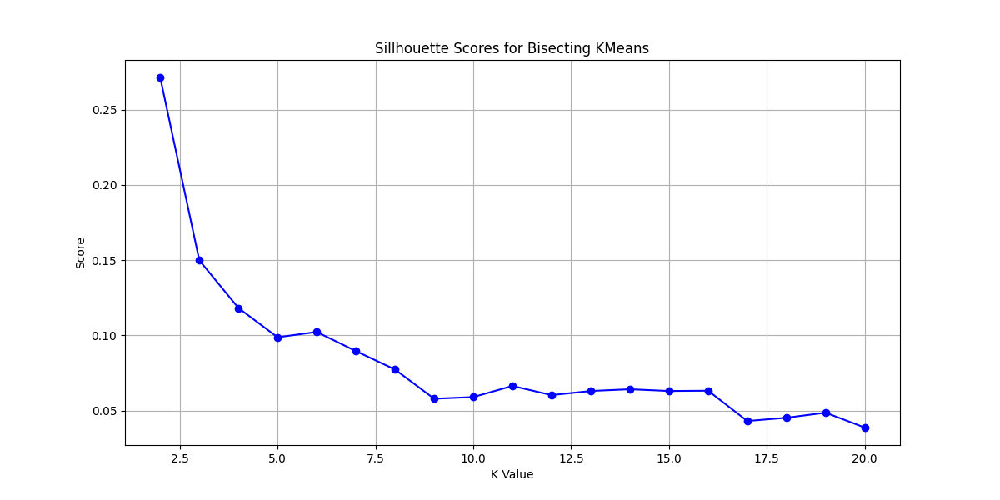

In [ ]:
# Plotting the line graph
plt.figure(figsize=(12, 6))
plt.plot(k_range, s_scores_bkm, marker='o', linestyle='-', color='b')
plt.title('Sillhouette Scores for Bisecting KMeans')
plt.xlabel('K Value')
plt.ylabel('Score')
plt.grid(True)
plt.show()
%matplot plt

##### KMeans

In [ ]:
k_range = range(2,21)

s_scores_kmeans = []

for k in k_range:
    kmeans = KMeans(
        featuresCol="features",
        k=k,
        predictionCol="cluster",
        seed=74797569
    )
    model = kmeans.fit(features_df)
    df_kmeans = model.transform(features_df)
    evaluator = ClusteringEvaluator(featuresCol="features",
                                    predictionCol="cluster",
                                    metricName="silhouette",
                                    distanceMeasure="squaredEuclidean")
    silhouette_score_kmeans = evaluator.evaluate(df_kmeans)
    s_scores_kmeans.append(silhouette_score_kmeans)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

Exception in thread cell_monitor-18:
Traceback (most recent call last):
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 980, in _bootstrap_inner
    self.run()
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 917, in run
    self._target(*self._args, **self._kwargs)
  File "/mnt/notebook-env/lib/python3.9/site-packages/awseditorssparkmonitoringwidget/cellmonitor.py", line 178, in cell_monitor
    job_binned_stages[job_id][stage_id] = all_stages[stage_id]
KeyError: 6394


VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

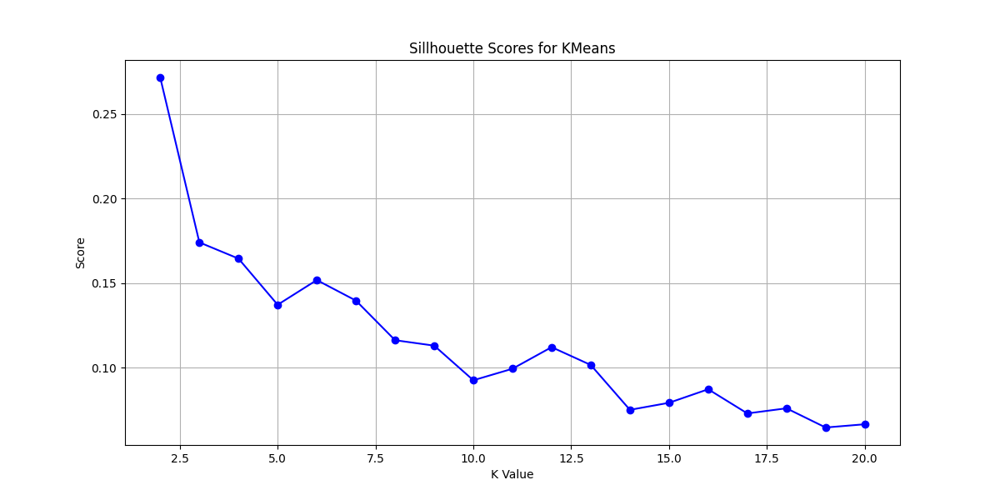

In [ ]:
# Plotting the line graph
plt.figure(figsize=(12, 6))
plt.plot(k_range, s_scores_kmeans, marker='o', linestyle='-', color='b')
plt.title('Sillhouette Scores for KMeans')
plt.xlabel('K Value')
plt.ylabel('Score')
plt.grid(True)
plt.show()
%matplot plt

In [ ]:
import numpy as np

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

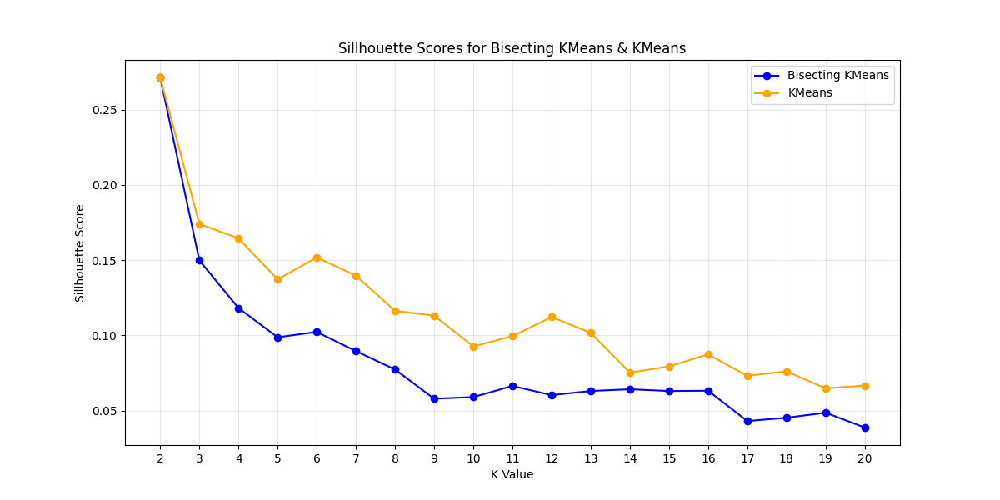

In [ ]:
# Plotting the line graph
plt.figure(figsize=(12, 6))
plt.plot(k_range, s_scores_bkm, marker='o', linestyle='-', color='b')
plt.plot(k_range, s_scores_kmeans, marker='o', linestyle='-', color='orange')
plt.title('Sillhouette Scores for Bisecting KMeans & KMeans')
plt.xlabel('K Value')
plt.xticks(np.arange(min(k_range), max(k_range) + 1, 1))
plt.ylabel('Sillhouette Score')
plt.legend(['Bisecting KMeans', 'KMeans'])
plt.grid(True, alpha=0.3)
plt.show()
%matplot plt

##### Clustering using KMeans at k=2

In [ ]:
km2 = KMeans(
    featuresCol="features",
    k=2,
    predictionCol="cluster",
    seed=74797569
)
model_km2 = km2.fit(features_df)
df_km2 = model_km2.transform(features_df)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [ ]:
df_km2.show(5)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+--------------------+--------------------+-------+
|          image_path|            features|cluster|
+--------------------+--------------------+-------+
|s3a://bdcc2024-cp...|[0.0,0.0,3.568000...|      1|
|s3a://bdcc2024-cp...|[0.0,0.0,0.403819...|      0|
|s3a://bdcc2024-cp...|[0.0,0.0,32.24538...|      1|
|s3a://bdcc2024-cp...|[1.00314867496490...|      1|
|s3a://bdcc2024-cp...|[0.0,0.0,17.40109...|      0|
+--------------------+--------------------+-------+
only showing top 5 rows

In [ ]:
df_km2.groupBy("cluster").count().show()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+-------+------+
|cluster| count|
+-------+------+
|      1|282144|
|      0|267856|
+-------+------+

In [ ]:
sc.install_pypi_package("boto3")
sc.install_pypi_package("pillow==9.4.0")

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…


  Attempting uninstall: pillow
    Found existing installation: pillow 10.3.0
    Uninstalling pillow-10.3.0:
      Successfully uninstalled pillow-10.3.0



In [ ]:
import io
from io import BytesIO
import os
import boto3
from PIL import Image

from pyspark.sql.functions import col, regexp_extract

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [ ]:
df_0 = (
    df_km2.filter(df_km2.cluster==0)
    .withColumn('fpath', regexp_extract('image_path', r"cats_550k/.+", 0))
    .select('fpath')
    .limit(60)
    .collect()
)

c0 = [Row['fpath'] for Row in df_0]

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

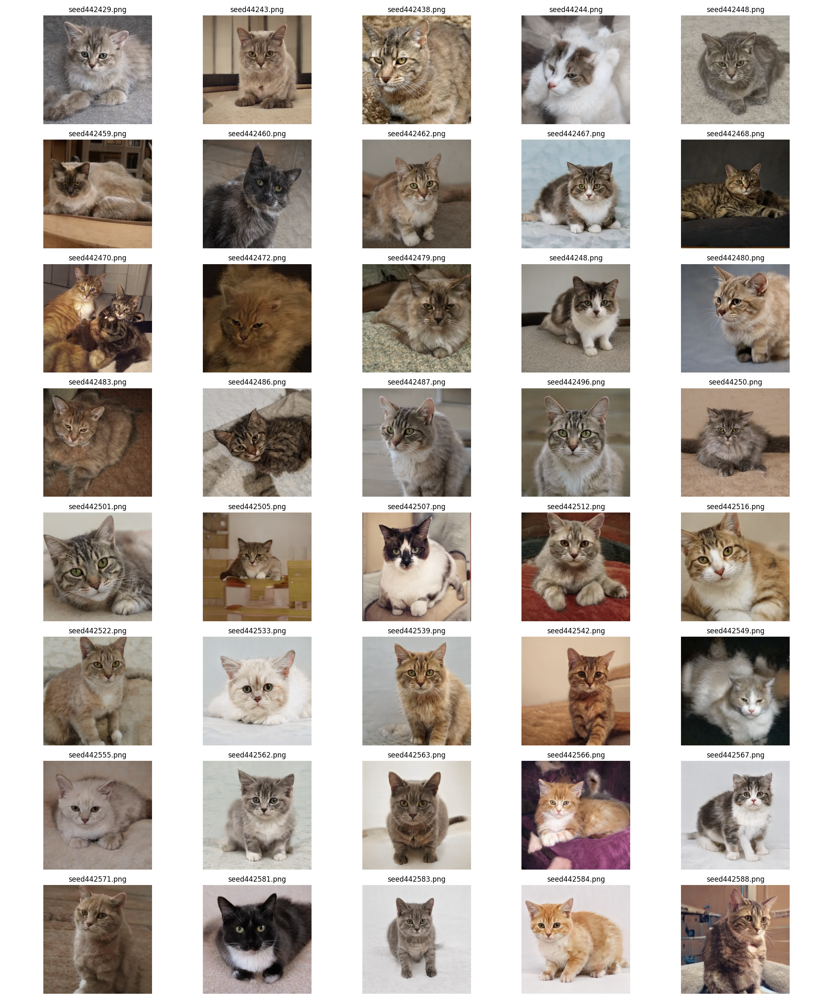

In [ ]:
bucket_name = 'bdcc2024-cpt5-finalproject'
cluster_images = c0[-40:]

# Define the grid size for displaying images
ncols = 5  # This sets the number of columns
nrows = 8

# Create a figure with a specified size
plt.figure(figsize=(20, 24))  # width x height

# Initialize S3 client
s3_client = boto3.client('s3')

# Loop through each image path in fpath_list, limiting the number of images
for i, image_key in enumerate(cluster_images):
    try:
        # Download the image object from S3
        image_object = s3_client.get_object(Bucket=bucket_name, Key=image_key)
        image_content = image_object['Body'].read()

        # Load image into PIL
        image = Image.open(BytesIO(image_content))

        # Add subplot for the image
        plt.subplot(nrows, ncols, i + 1)
        plt.imshow(image)
        plt.axis('off')  # Hide axes
        plt.title(image_key.split('/')[-1])  # Display the image file name as title
    except Exception as e:
        print(f"Error loading image {image_key}: {e}")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()
%matplot plt

In [ ]:
df_1 = (
    df_km2.filter(df_km2.cluster==1)
    .withColumn('fpath', regexp_extract('image_path', r"cats_550k/.+", 0))
    .select('fpath')
    .limit(120)
    .collect()
)

c1 = [Row['fpath'] for Row in df_1]

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [314]:
c1

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

['cats_550k/seed132640.png', 'cats_550k/seed132645.png', 'cats_550k/seed132649.png', 'cats_550k/seed132669.png', 'cats_550k/seed13267.png', 'cats_550k/seed132674.png', 'cats_550k/seed132686.png', 'cats_550k/seed132691.png', 'cats_550k/seed132695.png', 'cats_550k/seed132706.png', 'cats_550k/seed132735.png', 'cats_550k/seed132751.png', 'cats_550k/seed132755.png', 'cats_550k/seed13276.png', 'cats_550k/seed132766.png', 'cats_550k/seed132776.png', 'cats_550k/seed132785.png', 'cats_550k/seed132789.png', 'cats_550k/seed132791.png', 'cats_550k/seed132800.png', 'cats_550k/seed132821.png', 'cats_550k/seed132825.png', 'cats_550k/seed132841.png', 'cats_550k/seed132842.png', 'cats_550k/seed132847.png', 'cats_550k/seed132850.png', 'cats_550k/seed132854.png', 'cats_550k/seed132866.png', 'cats_550k/seed132872.png', 'cats_550k/seed132873.png', 'cats_550k/seed132876.png', 'cats_550k/seed132878.png', 'cats_550k/seed132899.png', 'cats_550k/seed13291.png', 'cats_550k/seed132919.png', 'cats_550k/seed132920.

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

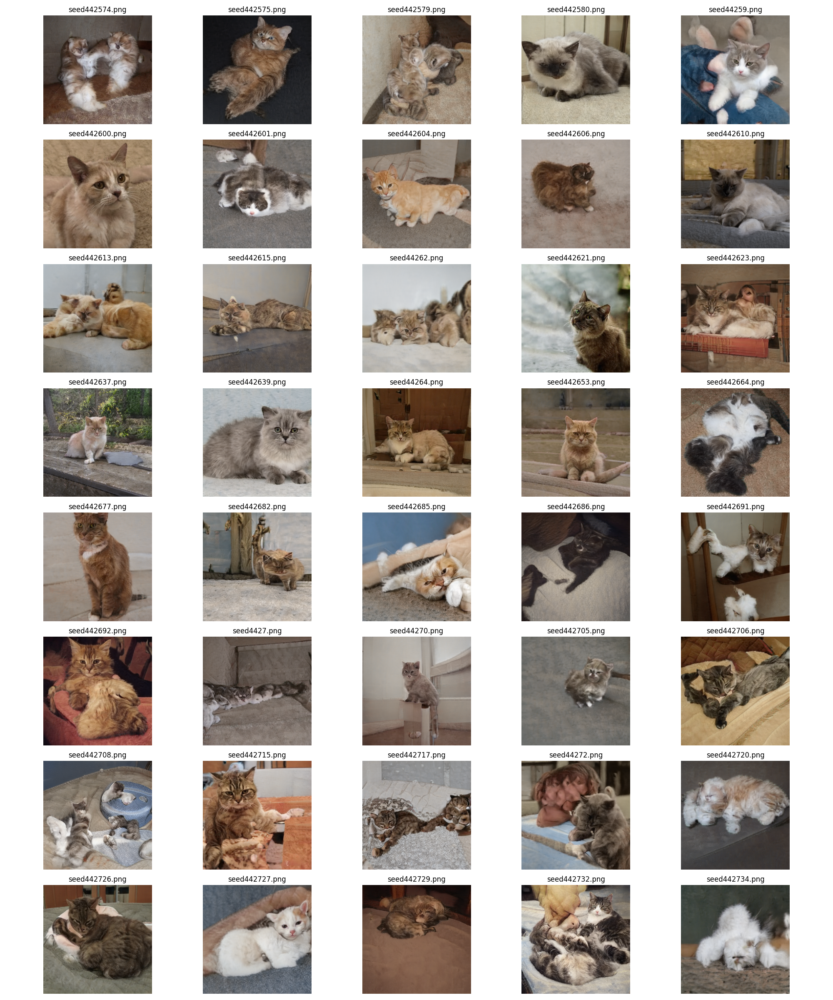

In [ ]:
c1 = [Row['fpath'] for Row in df_1]

bucket_name = 'bdcc2024-cpt5-finalproject'
cluster_images = c1[-40:]

# Define the grid size for displaying images
ncols = 5  # This sets the number of columns
nrows = 8

# Create a figure with a specified size
plt.figure(figsize=(20, 24))  # width x height

# Initialize S3 client
s3_client = boto3.client('s3')

# Loop through each image path in fpath_list, limiting the number of images
for i, image_key in enumerate(cluster_images):
    try:
        # Download the image object from S3
        image_object = s3_client.get_object(Bucket=bucket_name, Key=image_key)
        image_content = image_object['Body'].read()

        # Load image into PIL
        image = Image.open(BytesIO(image_content))

        # Add subplot for the image
        plt.subplot(nrows, ncols, i + 1)
        plt.imshow(image)
        plt.axis('off')  # Hide axes
        plt.title(image_key.split('/')[-1])  # Display the image file name as title
    except Exception as e:
        print(f"Error loading image {image_key}: {e}")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()
%matplot plt

We can clearly see that cluster_0 is are the well generated cat images while cluster_1 are the poorly generated cat images as seen by the deformations and distortions in the images

##### Sillhouette Scores for Subclusters

###### Good Cluster

In [ ]:
df_good = df_km2.filter(df_km2.cluster==0)
df_good.show(5)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+--------------------+--------------------+-------+
|          image_path|            features|cluster|
+--------------------+--------------------+-------+
|s3a://bdcc2024-cp...|[0.0,0.0,0.403819...|      0|
|s3a://bdcc2024-cp...|[0.0,0.0,17.40109...|      0|
|s3a://bdcc2024-cp...|[0.0,0.0,0.0,2.51...|      0|
|s3a://bdcc2024-cp...|[0.0,0.0,2.574101...|      0|
|s3a://bdcc2024-cp...|[0.0,0.0,1.262615...|      0|
+--------------------+--------------------+-------+
only showing top 5 rows

In [ ]:
k_range = range(2, 21)

s_scores_km2_good_km = []

for k in k_range:
    kmeans = KMeans(
        featuresCol="features",
        k=k,
        predictionCol="sub_cluster",
        seed=74797569
    )
    model = kmeans.fit(df_good)
    df_kmeans = model.transform(df_good)
    evaluator = ClusteringEvaluator(featuresCol="features",
                                    predictionCol="sub_cluster",
                                    metricName="silhouette",
                                    distanceMeasure="squaredEuclidean")
    silhouette_score_kmeans = evaluator.evaluate(df_kmeans)
    s_scores_km2_good_km.append(silhouette_score_kmeans)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

Exception in thread cell_monitor-72:
Traceback (most recent call last):
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 980, in _bootstrap_inner
    self.run()
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 917, in run
    self._target(*self._args, **self._kwargs)
  File "/mnt/notebook-env/lib/python3.9/site-packages/awseditorssparkmonitoringwidget/cellmonitor.py", line 178, in cell_monitor
    job_binned_stages[job_id][stage_id] = all_stages[stage_id]
KeyError: 7662


VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

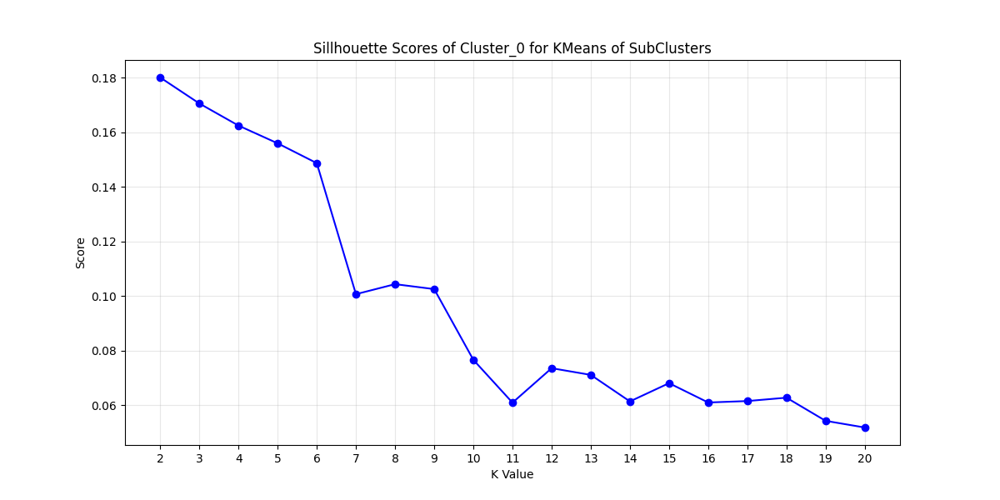

In [200]:
# Plotting the line graph
plt.figure(figsize=(12, 6))
plt.plot(k_range, s_scores_km2_good_km, marker='o', linestyle='-', color='b')
plt.title('Sillhouette Scores of Cluster_0 for KMeans of SubClusters')
plt.xlabel('K Value')
plt.xticks(np.arange(min(k_range), max(k_range) + 1, 1))
plt.ylabel('Score')
plt.grid(True, alpha=0.3)
plt.show()
%matplot plt

In [202]:
km5 = KMeans(
    featuresCol="features",
    k=5,
    predictionCol="sub_cluster",
    seed=74797569
)
model_km5 = km5.fit(df_good)
df_good_sub = model_km5.transform(df_good)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [203]:
df_good_sub.groupBy('sub_cluster').count().show()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+-----------+-----+
|sub_cluster|count|
+-----------+-----+
|          1|31963|
|          2|50614|
|          3|80985|
|          4|29397|
|          0|74897|
+-----------+-----+

###### Bad Cluster

In [ ]:
df_bad = df_km2.filter(df_km2.cluster==1)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [ ]:
k_range = range(2, 21)

s_scores_km2_bad_km = []

for k in k_range:
    kmeans = KMeans(
        featuresCol="features",
        k=k,
        predictionCol="sub_cluster",
        seed=74797569
    )
    model = kmeans.fit(df_bad)
    df_kmeans = model.transform(df_bad)
    evaluator = ClusteringEvaluator(featuresCol="features",
                                    predictionCol="sub_cluster",
                                    metricName="silhouette",
                                    distanceMeasure="squaredEuclidean")
    silhouette_score_kmeans = evaluator.evaluate(df_kmeans)
    s_scores_km2_bad_km.append(silhouette_score_kmeans)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

Exception in thread cell_monitor-110:
Traceback (most recent call last):
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 980, in _bootstrap_inner
    self.run()
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 917, in run
    self._target(*self._args, **self._kwargs)
  File "/mnt/notebook-env/lib/python3.9/site-packages/awseditorssparkmonitoringwidget/cellmonitor.py", line 178, in cell_monitor
    job_binned_stages[job_id][stage_id] = all_stages[stage_id]
KeyError: 9171


VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

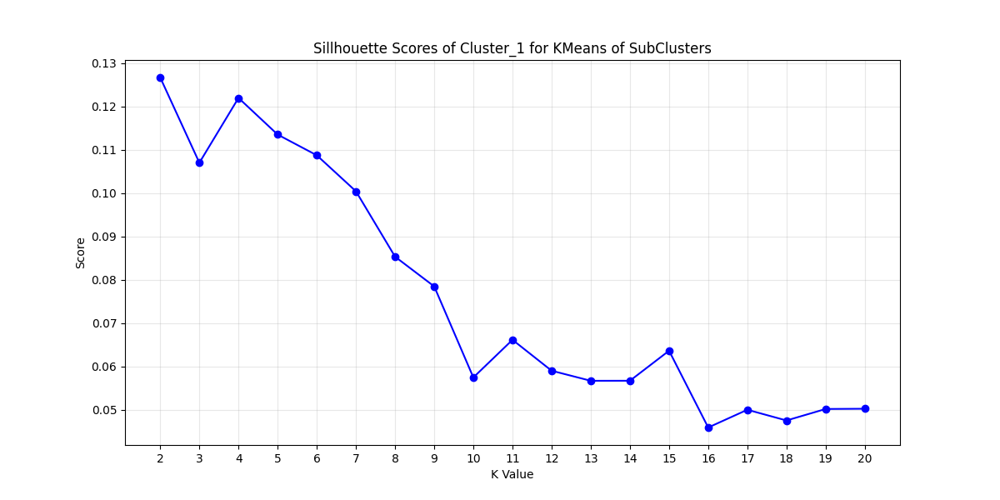

In [201]:
# Plotting the line graph
plt.figure(figsize=(12, 6))
plt.plot(k_range, s_scores_km2_bad_km, marker='o', linestyle='-', color='b')
plt.title('Sillhouette Scores of Cluster_1 for KMeans of SubClusters')
plt.xlabel('K Value')
plt.xticks(np.arange(min(k_range), max(k_range) + 1, 1))
plt.ylabel('Score')
plt.grid(True, alpha=0.3)
plt.show()
%matplot plt

In [207]:
km4 = KMeans(
    featuresCol="features",
    k=4,
    predictionCol="sub_cluster",
    seed=74797569
)
model_km4 = km4.fit(df_bad)
df_bad_sub = model_km4.transform(df_bad)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [208]:
df_bad_sub.groupBy('sub_cluster').count().show()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+-----------+-----+
|sub_cluster|count|
+-----------+-----+
|          1|41040|
|          2|76794|
|          3|73580|
|          0|90730|
+-----------+-----+

## Appendix

Permutations
      
Whole Data set - BisectingKMeans at 2
    Good
        KMeans
        BisectingKMeans
    Bad
        KMeans
        BisectingKMeans

### Using KMeans at k=2

In [ ]:
# ##### Clustering using KMeans at k=2

km2 = KMeans(
    featuresCol="features",
    k=2,
    predictionCol="cluster",
    seed=74797569
)
model_km2 = km2.fit(features_df)
df_km2 = model_km2.transform(features_df)

In [226]:
df_km2_good = df_km2.filter(df_km2.cluster==0)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+--------------------+--------------------+-------+
|          image_path|            features|cluster|
+--------------------+--------------------+-------+
|s3a://bdcc2024-cp...|[0.0,0.0,3.568000...|      1|
|s3a://bdcc2024-cp...|[0.0,0.0,0.403819...|      0|
|s3a://bdcc2024-cp...|[0.0,0.0,32.24538...|      1|
|s3a://bdcc2024-cp...|[1.00314867496490...|      1|
|s3a://bdcc2024-cp...|[0.0,0.0,17.40109...|      0|
+--------------------+--------------------+-------+
only showing top 5 rows

In [239]:
df_km2_good = df_km2.filter(df_km2.cluster==0)

s_scores_km2_good_km = []

k_range = range(2, 21)

for k in k_range:
    km2_km = KMeans(featuresCol='features',
                   k=k,
                   predictionCol='sub_cluster',
                   seed=74797569)
    model_km2_km = km2_km.fit(df_km2_good)
    df_km2_km = model_km2_km.transform(df_km2_good)
    evaluator = ClusteringEvaluator(featuresCol="features",
                                    predictionCol="sub_cluster",
                                    metricName="silhouette",
                                    distanceMeasure="squaredEuclidean")
    s_score = evaluator.evaluate(df_km2_km)
    s_scores_km2_good_km.append(s_score)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

Exception in thread cell_monitor-238:
Traceback (most recent call last):
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 980, in _bootstrap_inner
    self.run()
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 917, in run
    self._target(*self._args, **self._kwargs)
  File "/mnt/notebook-env/lib/python3.9/site-packages/awseditorssparkmonitoringwidget/cellmonitor.py", line 178, in cell_monitor
    job_binned_stages[job_id][stage_id] = all_stages[stage_id]
KeyError: 12696


VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

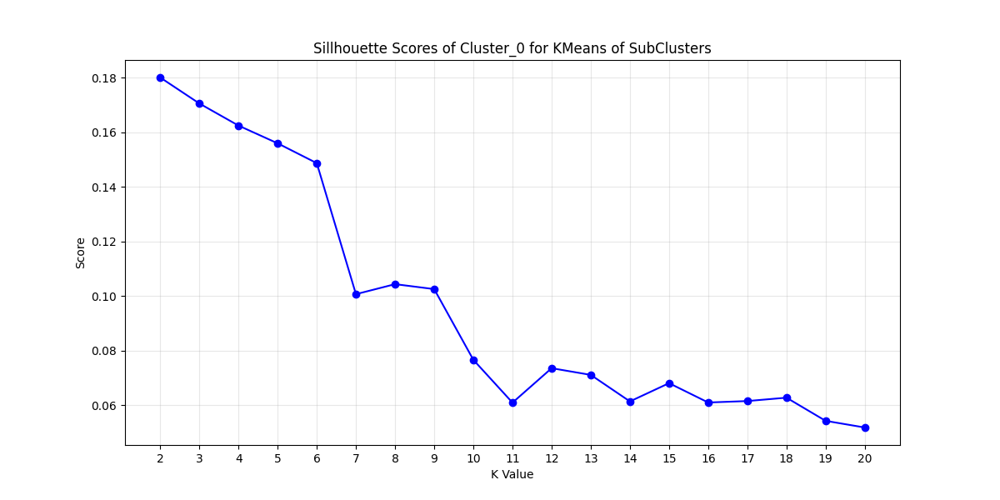

In [242]:
# Plotting the line graph
plt.figure(figsize=(12, 6))
plt.plot(k_range, s_scores_km2_good_km, marker='o', linestyle='-', color='b')
plt.title('Sillhouette Scores of Cluster_0 for KMeans of SubClusters')
plt.xlabel('K Value')
plt.xticks(np.arange(min(k_range), max(k_range) + 1, 1))
plt.ylabel('Score')
plt.grid(True, alpha=0.3)
plt.show()
%matplot plt

In [243]:
df_km2_bad = df_km2.filter(df_km2.cluster==1)

s_scores_km2_bad_km = []

k_range = range(2, 21)

for k in k_range:
    km2_km = KMeans(featuresCol='features',
                   k=k,
                   predictionCol='sub_cluster',
                   seed=74797569)
    model_km2_km = km2_km.fit(df_km2_bad)
    df_km2_km = model_km2_km.transform(df_km2_bad)
    evaluator = ClusteringEvaluator(featuresCol="features",
                                    predictionCol="sub_cluster",
                                    metricName="silhouette",
                                    distanceMeasure="squaredEuclidean")
    s_score = evaluator.evaluate(df_km2_km)
    s_scores_km2_bad_km.append(s_score)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

Exception in thread cell_monitor-242:
Traceback (most recent call last):
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 980, in _bootstrap_inner
    self.run()
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 917, in run
    self._target(*self._args, **self._kwargs)
  File "/mnt/notebook-env/lib/python3.9/site-packages/awseditorssparkmonitoringwidget/cellmonitor.py", line 178, in cell_monitor
    job_binned_stages[job_id][stage_id] = all_stages[stage_id]
KeyError: 14079


VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

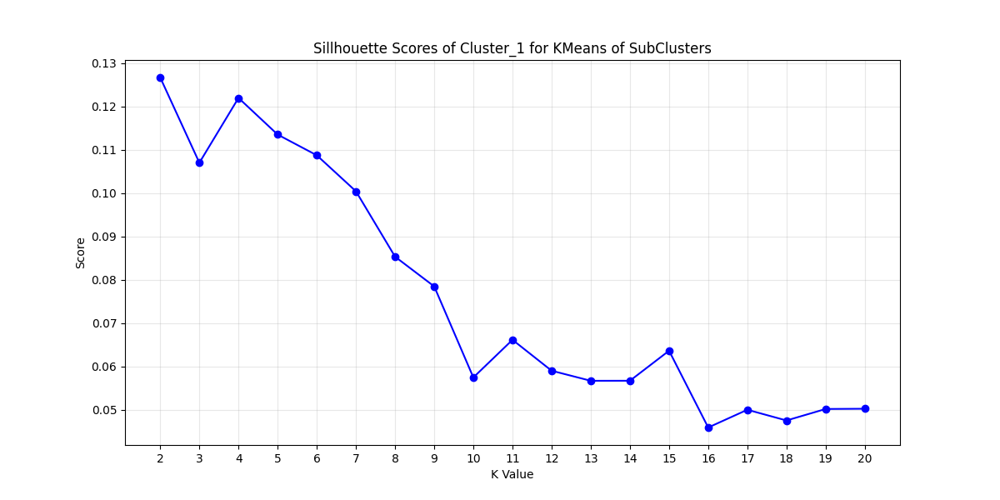

In [244]:
# Plotting the line graph
plt.figure(figsize=(12, 6))
plt.plot(k_range, s_scores_km2_bad_km, marker='o', linestyle='-', color='b')
plt.title('Sillhouette Scores of Cluster_1 for KMeans of SubClusters')
plt.xlabel('K Value')
plt.xticks(np.arange(min(k_range), max(k_range) + 1, 1))
plt.ylabel('Score')
plt.grid(True, alpha=0.3)
plt.show()
%matplot plt

In [245]:
df_km2_good = df_km2.filter(df_km2.cluster==0)

s_scores_km2_good_bkm = []

k_range = range(2, 21)

for k in k_range:
    km2_bkm = BisectingKMeans(featuresCol='features',
                   k=k,
                   predictionCol='sub_cluster',
                   seed=74797569)
    model_km2_bkm = km2_bkm.fit(df_km2_good)
    df_km2_bkm = model_km2_bkm.transform(df_km2_good)
    evaluator = ClusteringEvaluator(featuresCol="features",
                                    predictionCol="sub_cluster",
                                    metricName="silhouette",
                                    distanceMeasure="squaredEuclidean")
    s_score = evaluator.evaluate(df_km2_bkm)
    s_scores_km2_good_bkm.append(s_score)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

Exception in thread cell_monitor-244:
Traceback (most recent call last):
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 980, in _bootstrap_inner
    self.run()
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 917, in run
    self._target(*self._args, **self._kwargs)
  File "/mnt/notebook-env/lib/python3.9/site-packages/awseditorssparkmonitoringwidget/cellmonitor.py", line 178, in cell_monitor
    job_binned_stages[job_id][stage_id] = all_stages[stage_id]
KeyError: 14994


VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

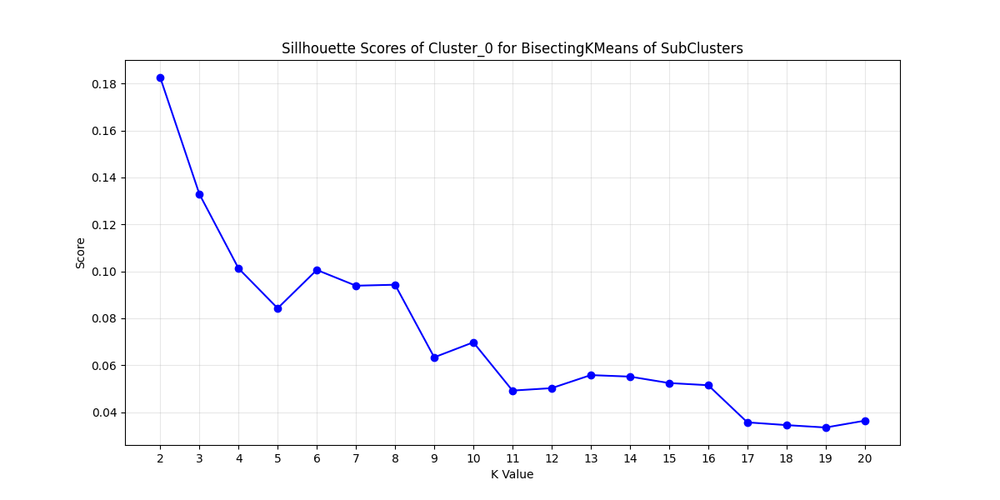

In [250]:
# Plotting the line graph
plt.figure(figsize=(12, 6))
plt.plot(k_range, s_scores_km2_good_bkm, marker='o', linestyle='-', color='b')
plt.title('Sillhouette Scores of Cluster_0 for BisectingKMeans of SubClusters')
plt.xlabel('K Value')
plt.xticks(np.arange(min(k_range), max(k_range) + 1, 1))
plt.ylabel('Score')
plt.grid(True, alpha=0.3)
plt.show()
%matplot plt

In [247]:
df_km2_bad = df_km2.filter(df_km2.cluster==1)

s_scores_km2_bad_bkm = []

k_range = range(2, 21)

for k in k_range:
    km2_bkm = BisectingKMeans(featuresCol='features',
                   k=k,
                   predictionCol='sub_cluster',
                   seed=74797569)
    model_km2_bkm = km2_bkm.fit(df_km2_bad)
    df_km2_bkm = model_km2_bkm.transform(df_km2_bad)
    evaluator = ClusteringEvaluator(featuresCol="features",
                                    predictionCol="sub_cluster",
                                    metricName="silhouette",
                                    distanceMeasure="squaredEuclidean")
    s_score = evaluator.evaluate(df_km2_bkm)
    s_scores_km2_bad_bkm.append(s_score)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

Exception in thread cell_monitor-246:
Traceback (most recent call last):
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 980, in _bootstrap_inner
    self.run()
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 917, in run
    self._target(*self._args, **self._kwargs)
  File "/mnt/notebook-env/lib/python3.9/site-packages/awseditorssparkmonitoringwidget/cellmonitor.py", line 178, in cell_monitor
    job_binned_stages[job_id][stage_id] = all_stages[stage_id]
KeyError: 17896


VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

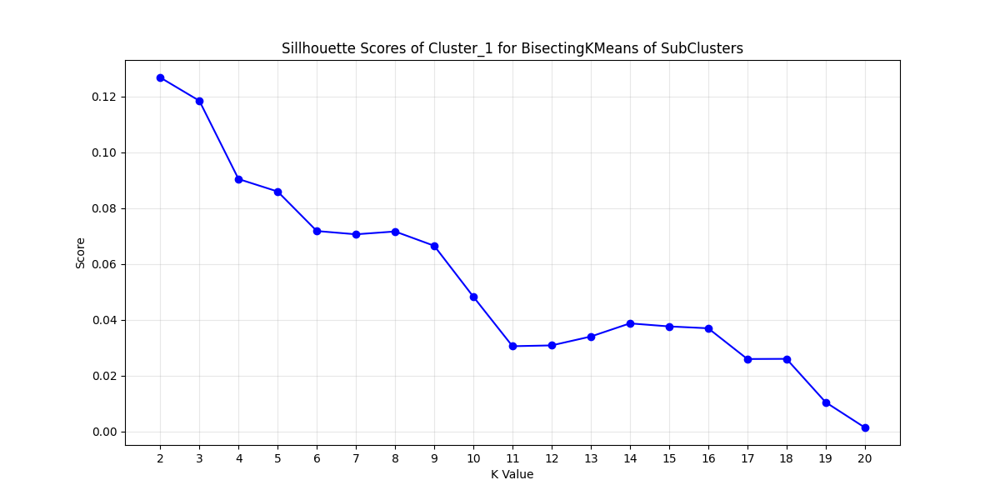

In [249]:
# Plotting the line graph
plt.figure(figsize=(12, 6))
plt.plot(k_range, s_scores_km2_bad_bkm, marker='o', linestyle='-', color='b')
plt.title('Sillhouette Scores of Cluster_1 for BisectingKMeans of SubClusters')
plt.xlabel('K Value')
plt.xticks(np.arange(min(k_range), max(k_range) + 1, 1))
plt.ylabel('Score')
plt.grid(True, alpha=0.3)
plt.show()
%matplot plt

### Using Bisecting KMeans at k=2

In [251]:
# Clustering using BisectingKMeans at k=2

bkm2 = BisectingKMeans(
    featuresCol="features",
    k=2,
    predictionCol="cluster",
    seed=74797569
)
model_bkm2 = bkm2.fit(features_df)
df_bkm2 = model_bkm2.transform(features_df)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

In [252]:
df_bkm2.groupBy('cluster').count().show()

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

+-------+------+
|cluster| count|
+-------+------+
|      1|267855|
|      0|282145|
+-------+------+

In [260]:
df_bkm2_good = df_bkm2.filter(df_bkm2.cluster==0)

s_scores_bkm2_good_km = []

k_range = range(2, 21)

for k in k_range:
    bkm2_km = KMeans(featuresCol='features',
                   k=k,
                   predictionCol='sub_cluster',
                   seed=74797569)
    model_bkm2_km = bkm2_km.fit(df_bkm2_good)
    df_bkm2_km = model_bkm2_km.transform(df_bkm2_good)
    evaluator = ClusteringEvaluator(featuresCol="features",
                                    predictionCol="sub_cluster",
                                    metricName="silhouette",
                                    distanceMeasure="squaredEuclidean")
    s_score = evaluator.evaluate(df_bkm2_km)
    s_scores_bkm2_good_km.append(s_score)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

Exception in thread cell_monitor-259:
Traceback (most recent call last):
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 980, in _bootstrap_inner
    self.run()
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 917, in run
    self._target(*self._args, **self._kwargs)
  File "/mnt/notebook-env/lib/python3.9/site-packages/awseditorssparkmonitoringwidget/cellmonitor.py", line 178, in cell_monitor
    job_binned_stages[job_id][stage_id] = all_stages[stage_id]
KeyError: 28297


VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

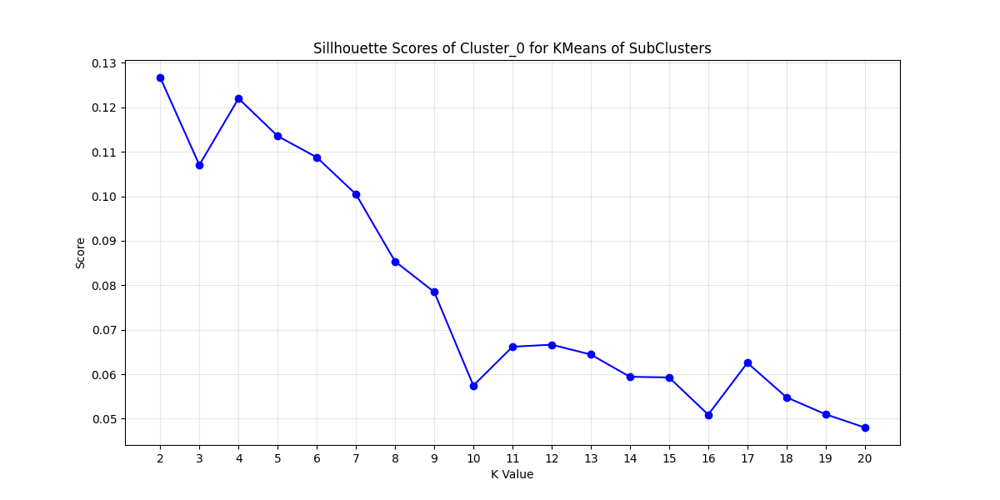

In [262]:
# Plotting the line graph
plt.figure(figsize=(12, 6))
plt.plot(k_range, s_scores_bkm2_good_km, marker='o', linestyle='-', color='b')
plt.title('Sillhouette Scores of Cluster_0 for KMeans of SubClusters')
plt.xlabel('K Value')
plt.xticks(np.arange(min(k_range), max(k_range) + 1, 1))
plt.ylabel('Score')
plt.grid(True, alpha=0.3)
plt.show()
%matplot plt

In [263]:
df_km2_bad = df_bkm2.filter(df_bkm2.cluster==1)

s_scores_km2_bad_km = []

k_range = range(2, 21)

for k in k_range:
    bkm2_km = KMeans(featuresCol='features',
                   k=k,
                   predictionCol='sub_cluster',
                   seed=74797569)
    model_bkm2_km = bkm2_km.fit(df_km2_bad)
    df_bkm2_km = model_bkm2_km.transform(df_km2_bad)
    evaluator = ClusteringEvaluator(featuresCol="features",
                                    predictionCol="sub_cluster",
                                    metricName="silhouette",
                                    distanceMeasure="squaredEuclidean")
    s_score = evaluator.evaluate(df_bkm2_km)
    s_scores_km2_bad_km.append(s_score)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

Exception in thread cell_monitor-262:
Traceback (most recent call last):
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 980, in _bootstrap_inner
    self.run()
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 917, in run
    self._target(*self._args, **self._kwargs)
  File "/mnt/notebook-env/lib/python3.9/site-packages/awseditorssparkmonitoringwidget/cellmonitor.py", line 178, in cell_monitor
    job_binned_stages[job_id][stage_id] = all_stages[stage_id]
KeyError: 29197


VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

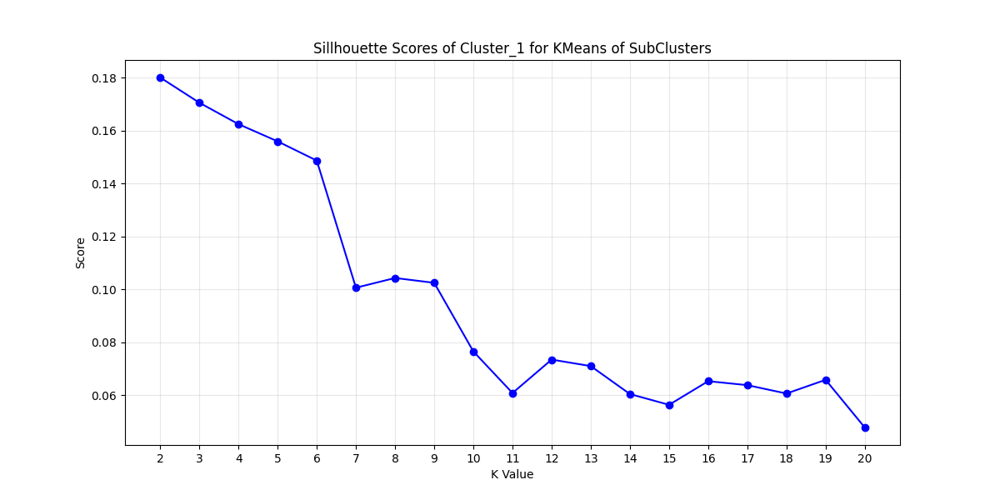

In [264]:
# Plotting the line graph
plt.figure(figsize=(12, 6))
plt.plot(k_range, s_scores_km2_bad_km, marker='o', linestyle='-', color='b')
plt.title('Sillhouette Scores of Cluster_1 for KMeans of SubClusters')
plt.xlabel('K Value')
plt.xticks(np.arange(min(k_range), max(k_range) + 1, 1))
plt.ylabel('Score')
plt.grid(True, alpha=0.3)
plt.show()
%matplot plt

In [265]:
df_bkm2_good = df_bkm2.filter(df_bkm2.cluster==0)

s_scores_bkm2_good_bkm = []

k_range = range(2, 21)

for k in k_range:
    bkm2_bkm = BisectingKMeans(featuresCol='features',
                   k=k,
                   predictionCol='sub_cluster',
                   seed=74797569)
    model_bkm2_bkm = bkm2_bkm.fit(df_bkm2_good)
    df_bkm2_bkm = model_bkm2_bkm.transform(df_bkm2_good)
    evaluator = ClusteringEvaluator(featuresCol="features",
                                    predictionCol="sub_cluster",
                                    metricName="silhouette",
                                    distanceMeasure="squaredEuclidean")
    s_score = evaluator.evaluate(df_bkm2_bkm)
    s_scores_bkm2_good_bkm.append(s_score)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

Exception in thread cell_monitor-264:
Traceback (most recent call last):
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 980, in _bootstrap_inner
    self.run()
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 917, in run
    self._target(*self._args, **self._kwargs)
  File "/mnt/notebook-env/lib/python3.9/site-packages/awseditorssparkmonitoringwidget/cellmonitor.py", line 178, in cell_monitor
    job_binned_stages[job_id][stage_id] = all_stages[stage_id]
KeyError: 30645


VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

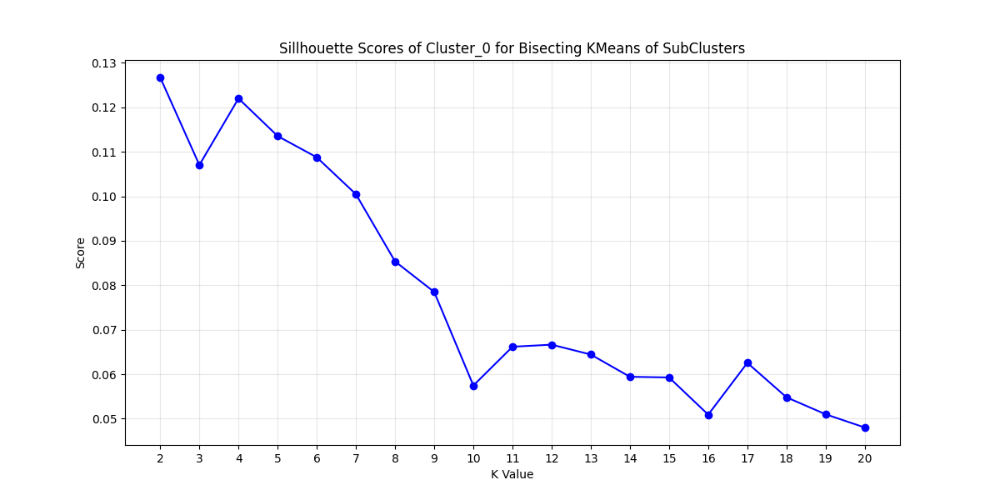

In [266]:
# Plotting the line graph
plt.figure(figsize=(12, 6))
plt.plot(k_range, s_scores_bkm2_good_km, marker='o', linestyle='-', color='b')
plt.title('Sillhouette Scores of Cluster_0 for Bisecting KMeans of SubClusters')
plt.xlabel('K Value')
plt.xticks(np.arange(min(k_range), max(k_range) + 1, 1))
plt.ylabel('Score')
plt.grid(True, alpha=0.3)
plt.show()
%matplot plt

In [267]:
df_km2_bad = df_bkm2.filter(df_bkm2.cluster==1)

s_scores_km2_bad_bkm = []

k_range = range(2, 21)

for k in k_range:
    bkm2_bkm = BisectingKMeans(featuresCol='features',
                   k=k,
                   predictionCol='sub_cluster',
                   seed=74797569)
    model_bkm2_bkm = bkm2_bkm.fit(df_km2_bad)
    df_bkm2_bkm = model_bkm2_bkm.transform(df_km2_bad)
    evaluator = ClusteringEvaluator(featuresCol="features",
                                    predictionCol="sub_cluster",
                                    metricName="silhouette",
                                    distanceMeasure="squaredEuclidean")
    s_score = evaluator.evaluate(df_bkm2_bkm)
    s_scores_km2_bad_bkm.append(s_score)

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

Exception in thread cell_monitor-266:
Traceback (most recent call last):
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 980, in _bootstrap_inner
    self.run()
  File "/mnt/notebook-env/lib/python3.9/threading.py", line 917, in run
    self._target(*self._args, **self._kwargs)
  File "/mnt/notebook-env/lib/python3.9/site-packages/awseditorssparkmonitoringwidget/cellmonitor.py", line 178, in cell_monitor
    job_binned_stages[job_id][stage_id] = all_stages[stage_id]
KeyError: 33495


VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

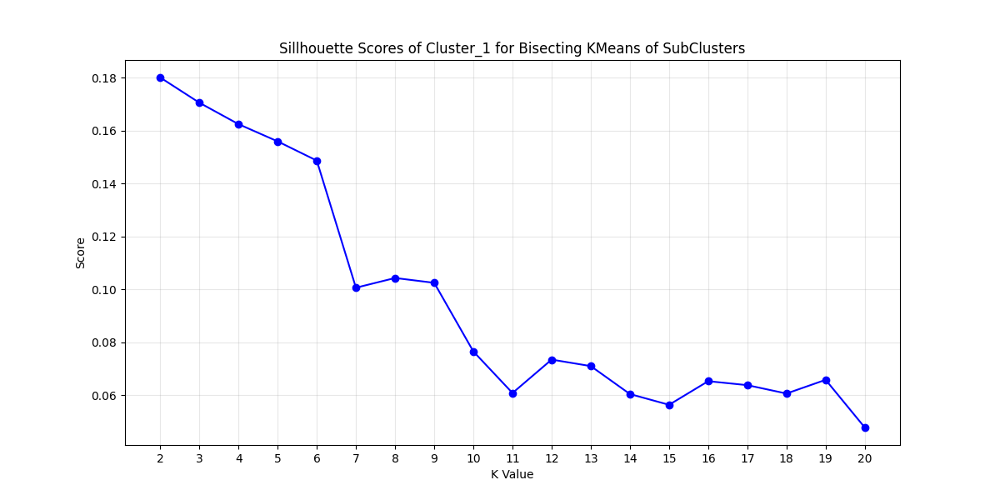

In [269]:
# Plotting the line graph
plt.figure(figsize=(12, 6))
plt.plot(k_range, s_scores_km2_bad_km, marker='o', linestyle='-', color='b')
plt.title('Sillhouette Scores of Cluster_1 for Bisecting KMeans of SubClusters')
plt.xlabel('K Value')
plt.xticks(np.arange(min(k_range), max(k_range) + 1, 1))
plt.ylabel('Score')
plt.grid(True, alpha=0.3)
plt.show()
%matplot plt

### Show Cats

In [307]:
df_subcluster = spark.read.parquet("s3a://bdcc2024-cpt5-finalproject/cats_sub_cluster/")
# cluster --  0 or 1; 0=good cluster, 1=bad cluster
# subcluster -- if cluster=0, 0 to 4; if cluster=1, 0 to 3
# page -- 1 to 5
def show_cats(cluster, subcluster, page=1):
    
    bucket_name = 'bdcc2024-cpt5-finalproject'
    
    df = (
        df_subcluster.filter(
            (df_subcluster.cluster==cluster) & (df_subcluster.sub_cluster==subcluster)
        )
        .withColumn('fpath', regexp_extract('image_path', r"cats_550k/.+", 0))
        .select('fpath')
        .limit(100)
        .collect()
    )
       
    cluster_images = [Row['fpath'] for Row in df]
    cluster_images = cluster_images[(page-1)*20 : page*20]
    
    # Define the grid size for displaying images
    ncols = 5  # This sets the number of columns
    nrows = 4

    # Create a figure with a specified size
    plt.figure(figsize=(9, 9))  # width x height

    # Initialize S3 client
    s3_client = boto3.client('s3')

    # Loop through each image path in fpath_list, limiting the number of images
    for i, image_key in enumerate(cluster_images):
        try:
            # Download the image object from S3
            image_object = s3_client.get_object(Bucket=bucket_name, Key=image_key)
            image_content = image_object['Body'].read()

            # Load image into PIL
            image = Image.open(BytesIO(image_content))

            # Add subplot for the image
            plt.subplot(nrows, ncols, i + 1)
            plt.imshow(image)
            plt.axis('off')  # Hide axes
            plt.title(image_key.split('/')[-1])  # Display the image file name as title
        except Exception as e:
            print(f"Error loading image {image_key}: {e}")

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()
    return(cluster_images)
    

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

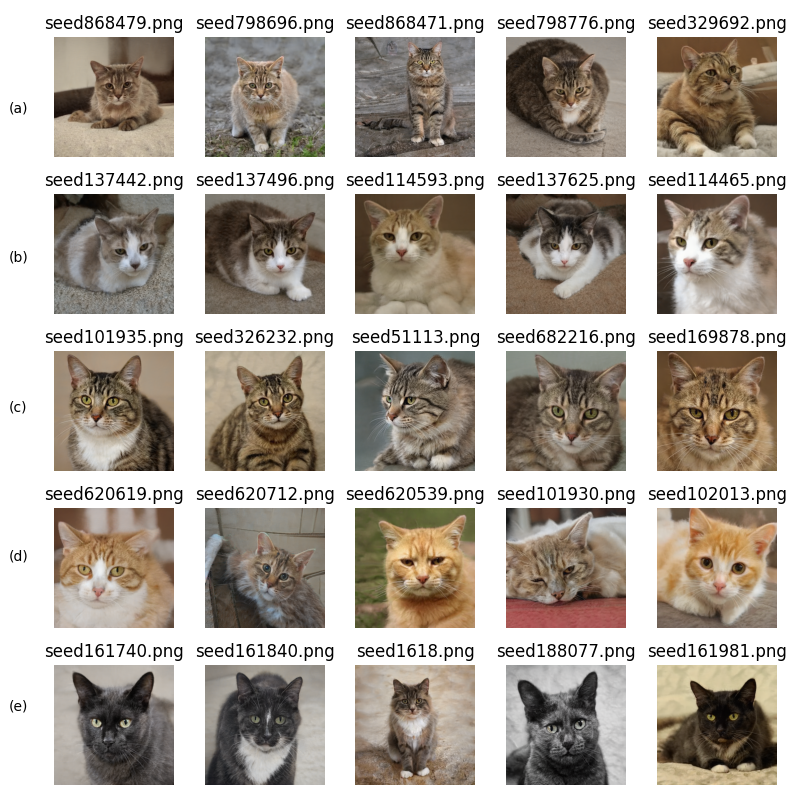

In [354]:
df_subcluster = spark.read.parquet("s3a://bdcc2024-cpt5-finalproject/cats_sub_cluster/")

good_cats = [
    "cats_550k/seed868479.png", "cats_550k/seed798696.png", "cats_550k/seed868471.png", "cats_550k/seed798776.png", "cats_550k/seed329692.png", # black and yellow undertones
    "cats_550k/seed137442.png", "cats_550k/seed137496.png", "cats_550k/seed114593.png", "cats_550k/seed137625.png", "cats_550k/seed114465.png", # white snout and breast
    "cats_550k/seed101935.png", "cats_550k/seed326232.png", "cats_550k/seed51113.png", "cats_550k/seed682216.png", "cats_550k/seed169878.png", # Striped face
    "cats_550k/seed620619.png", "cats_550k/seed620712.png", "cats_550k/seed620539.png", "cats_550k/seed101930.png", "cats_550k/seed102013.png", # white and yellow/gingers
    "cats_550k/seed161740.png", "cats_550k/seed161840.png", "cats_550k/seed1618.png", "cats_550k/seed188077.png", "cats_550k/seed161981.png"  # white to black/gray colored
]

bucket_name = 'bdcc2024-cpt5-finalproject'

# Define the grid size for displaying images
ncols = 5  # This sets the number of columns
nrows = 5

# Create a figure with a specified size
plt.figure(figsize=(8, 8))  # width x height
plt.text(-0.05,0.9,"(a)")
plt.text(-0.05,0.7,"(b)")
plt.text(-0.05,0.5,"(c)")
plt.text(-0.05,0.3,"(d)")
plt.text(-0.05,0.1,"(e)")
plt.axis('off')

# Initialize S3 client
s3_client = boto3.client('s3')

# Loop through each image path in fpath_list, limiting the number of images
for i, image_key in enumerate(good_cats):
    try:
        # Download the image object from S3
        image_object = s3_client.get_object(Bucket=bucket_name, Key=image_key)
        image_content = image_object['Body'].read()

        # Load image into PIL
        image = Image.open(BytesIO(image_content))

        # Add subplot for the image
        plt.subplot(nrows, ncols, i + 1)
        plt.imshow(image)
        plt.axis('off')  # Hide axes
        plt.title(image_key.split('/')[-1])  # Display the image file name as title
    except Exception as e:
        print(f"Error loading image {image_key}: {e}")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()
%matplot plt

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

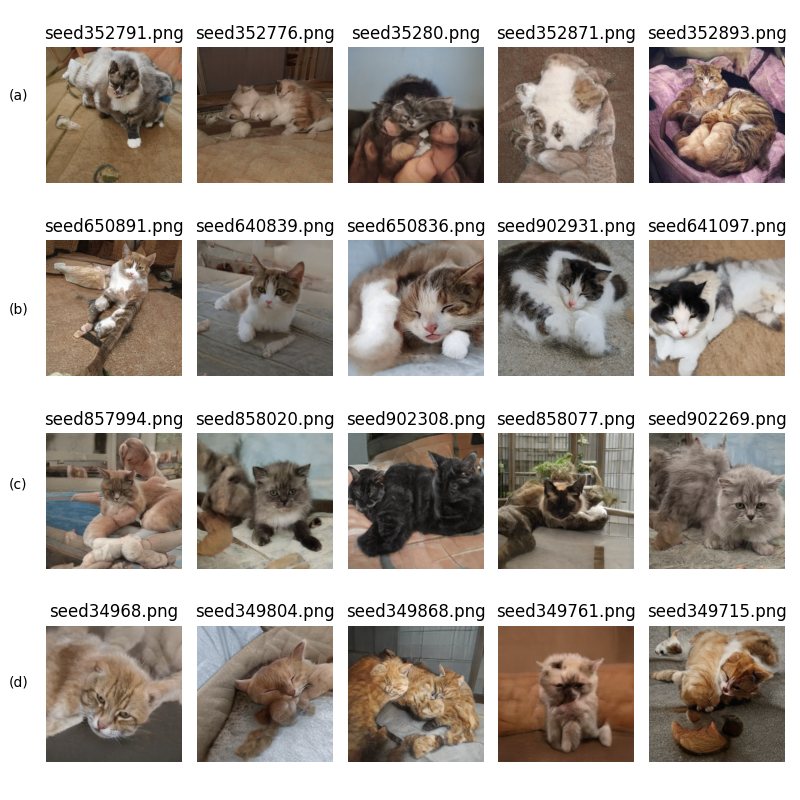

In [352]:
# df_subcluster = spark.read.parquet("s3a://bdcc2024-cpt5-finalproject/cats_sub_cluster/")

bad_cats = [
    'cats_550k/seed352791.png', 'cats_550k/seed352776.png', 'cats_550k/seed35280.png', 'cats_550k/seed352871.png', 'cats_550k/seed352893.png', # Extremely deformed
    'cats_550k/seed650891.png', 'cats_550k/seed640839.png', 'cats_550k/seed650836.png', 'cats_550k/seed902931.png', 'cats_550k/seed641097.png', # White Snout and Chest 
    'cats_550k/seed857994.png', 'cats_550k/seed858020.png', 'cats_550k/seed902308.png', 'cats_550k/seed858077.png', 'cats_550k/seed902269.png', # Black to Yellow/Ginger Colors
    'cats_550k/seed34968.png', 'cats_550k/seed349804.png', 'cats_550k/seed349868.png', 'cats_550k/seed349761.png', 'cats_550k/seed349715.png' # White to Yellow/Ginger Colors
]

bucket_name = 'bdcc2024-cpt5-finalproject'

# Define the grid size for displaying images
ncols = 5  # This sets the number of columns
nrows = 4

# Create a figure with a specified size
plt.figure(figsize=(8, 8))  # width x height
plt.text(-0.05,0.9,"(a)")
plt.text(-0.05,0.62,"(b)")
plt.text(-0.05,0.39,"(c)")
plt.text(-0.05,0.13,"(d)")
plt.axis('off')
# Initialize S3 client
s3_client = boto3.client('s3')

# Loop through each image path in fpath_list, limiting the number of images
for i, image_key in enumerate(bad_cats):
    try:
        # Download the image object from S3
        image_object = s3_client.get_object(Bucket=bucket_name, Key=image_key)
        image_content = image_object['Body'].read()

        # Load image into PIL
        image = Image.open(BytesIO(image_content))

        # Add subplot for the image
        plt.subplot(nrows, ncols, i + 1)
        plt.imshow(image)
        plt.axis('off')  # Hide axes
        plt.title(image_key.split('/')[-1])  # Display the image file name as title
    except Exception as e:
        print(f"Error loading image {image_key}: {e}")

# Adjust layout to prevent overlap
plt.tight_layout()

plt.show()
%matplot plt

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

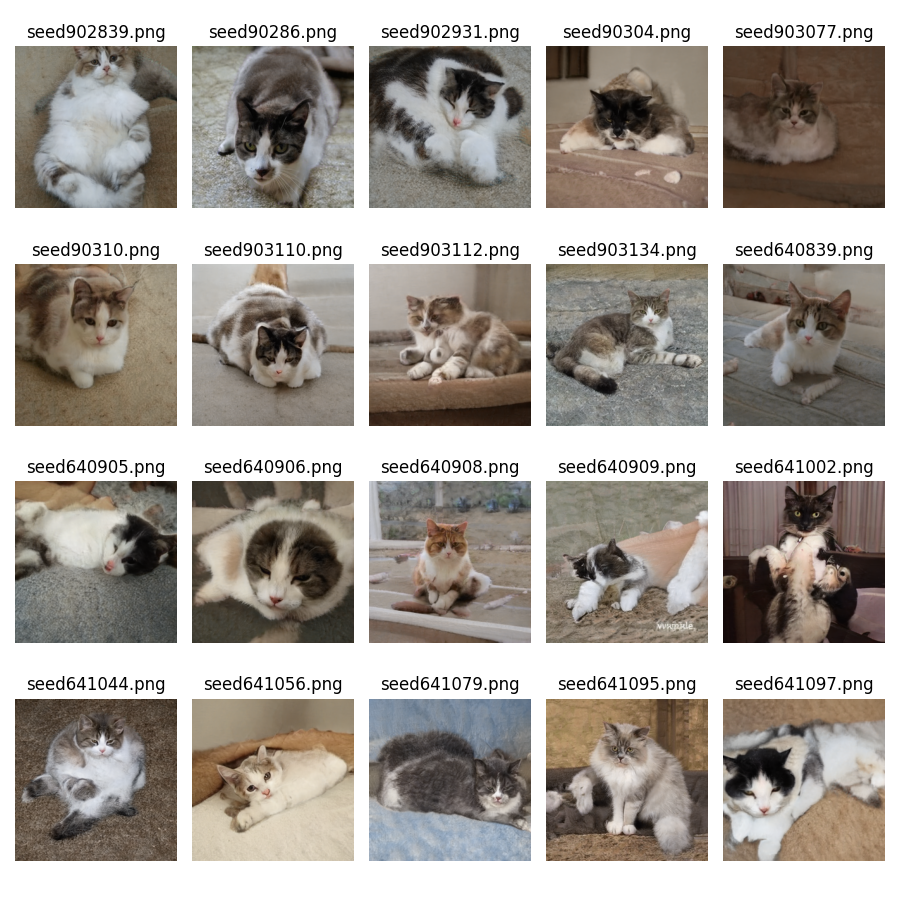

In [331]:
show_cats(1, 1, 1) # Good Cluster, Sub_Cluster 1, Page 2
%matplot plt

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

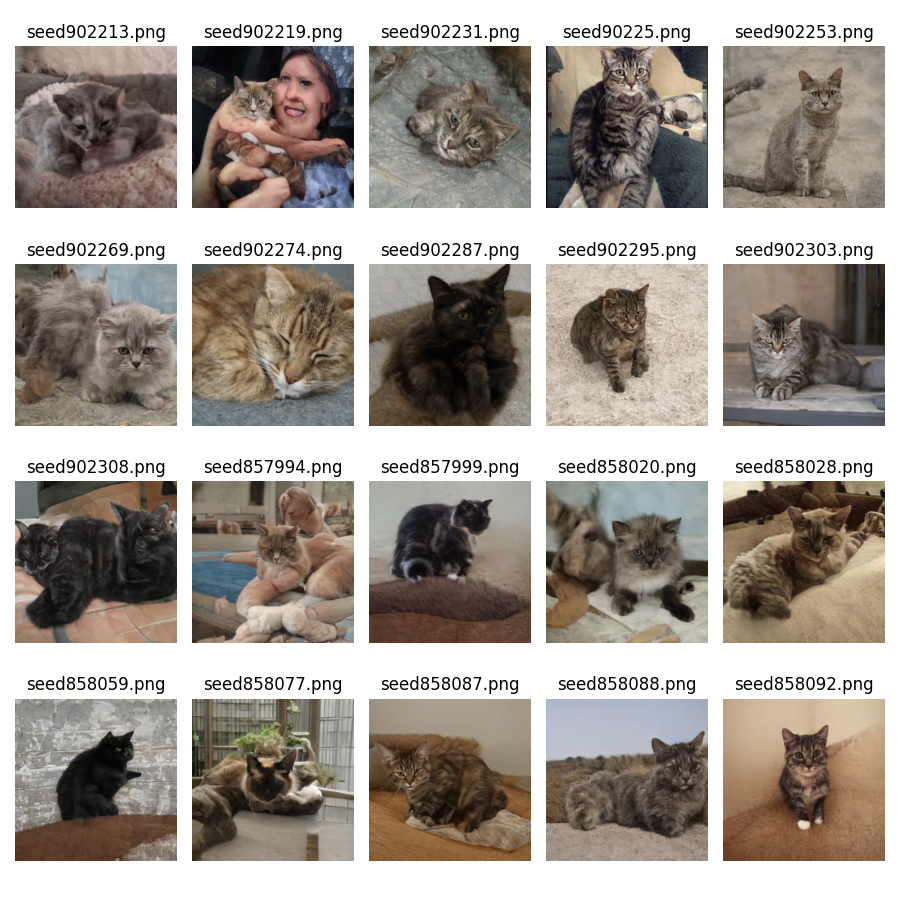

In [328]:
show_cats(1, 2, 4) # Good Cluster, Sub_Cluster 1, Page 2
%matplot plt

VBox()

FloatProgress(value=0.0, bar_style='info', description='Progress:', layout=Layout(height='25px', width='50%'),…

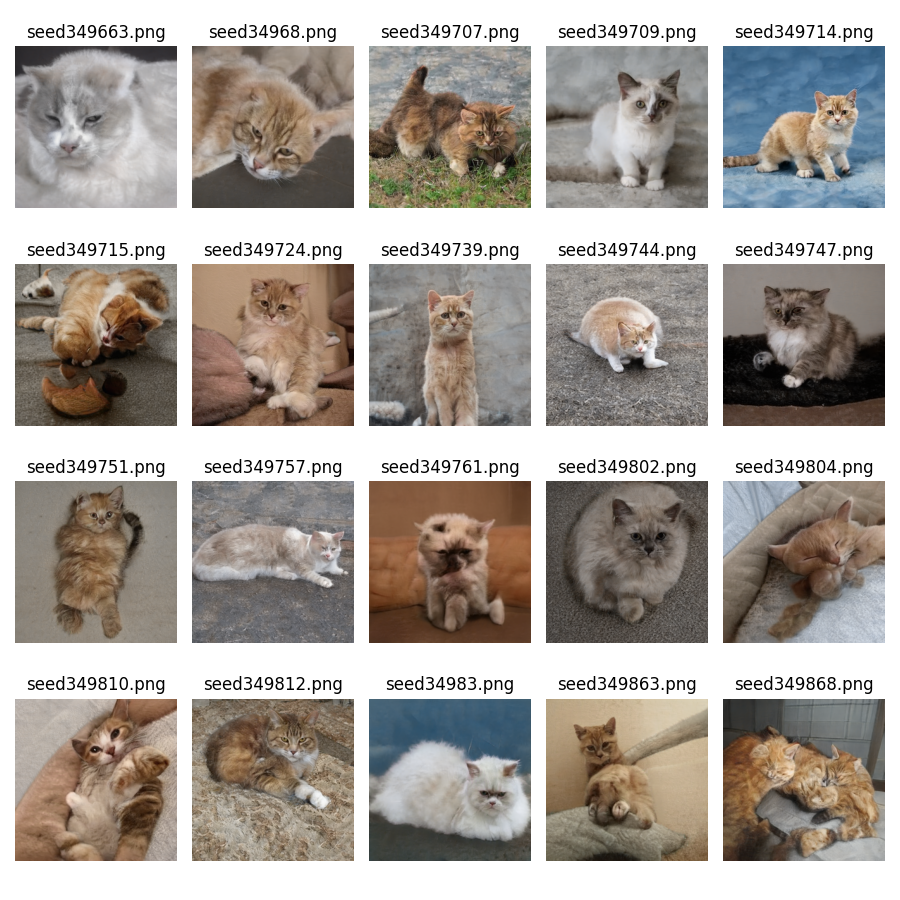

In [329]:
show_cats(1, 3, 4) # Good Cluster, Sub_Cluster 1, Page 2
%matplot plt